# Capstone Project - COURSERA CAPSTONE PROJECT:  ROAD ACCIDENTS CAUSES IN SEATTLE (Week 2)
### Applied Data Science Capstone by IBM/CourseraCapstone Project - ROAD ACCIDENTS CAUSES IN SEATTLE (Week 2)
### Applied Data Science Capstone by Raul Trujillo

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)

In [1]:

## Introduction: Business Problem <a name="introduction"></a>

Road traffic injuries are a major but neglected public health challenge that requires concerted efforts for effective and sustainable prevention. Of all the systems with which people have to deal every day, road traffic systems are the most complex and the most dangerous. Worldwide, an estimated 1.2 million people are killed in road crashes each year and as many as 50 million are injured. Projections indicate that these figures will increase by about 65% over the next 20 years unless there is new commitment to prevention. Nevertheless, the tragedy behind these figures attracts less mass media attention than let´s say, Corona Virus for instance. 


With these statements in mind, the aim of this project is to establish which variables are more influential to causing severe road  accidents, other than the obvious candidates like speeding or DUI´s, which in my opinion have been thoroughly studied in the past. There are many other factors in play that could cause an accident like weather or light conditions, condition of the pavement and so on. The base of this investigation is to determine whether these external factors are as influential to accident causation as the driver´s behavior behind the wheel. 

Even though there are many dataset available in Kaggle in terms of road accidents, I couldn´t find any other set that had the variables I wanted to include in my analysis, specifically road and light conditions, as well as the coordinates of the accidents to determine if there are stretches on the road systems where accidents are more likely to happen that in others.


In [2]:
## Data <a name="data"></a>

Github was used for a repository but I mainly worked in the Jupyter labs environment which felt more natural to me.

The data was read directly from the url: https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Metadata.pdf using !wget and  uploaded to IBM Cloud.

The Python libraries utilized throughout the analysis were Pandas, Numpy, Matplotlib, Seaborn and Folium for geographical visualization of the incidents

The dataset comprised of 38 colums or variables and 194.673 incidents, both matched and unmatched,  from which I selected only the features were necessary for my approach, namely, severity of the accident, coordinates x and y of the incident, weather, road condition, and light condition. All other variables were dropped as they added no value to the investigation in the first steps. All Nan values were dropped

In this preliminary stage we will only focus on looking at the dataset to figure out the next steps




In [3]:
#This jupyter notebook´s purpose will be to develop a ML model to identify the main causes of severe or deadly car accidents, taking external factors as road condition and light conditions as independent variables

In [4]:
#for the sake of simplicity we will import the most basic libraries to wrangle the data first and as the analysys develops, we could be importing other libraries
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import preprocessing, metrics
from scipy import stats
import scipy as sp
import random
import seaborn as sns
import scipy.optimize as opt
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,f1_score,log_loss,classification_report,confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import metrics
import pydotplus
import matplotlib.image as mpimg
from io import StringIO
import itertools
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
import folium
import webbrowser
from folium import plugins
import pandas as pd
import numpy as np
from sklearn import preprocessing
from scipy import stats
import scipy as sp
import random
import seaborn as sns
from sklearn.metrics import accuracy_score,f1_score,log_loss,classification_report,confusion_matrix,jaccard_similarity_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import svm
from sklearn import metrics
import pydotplus
import matplotlib.image as mpimg
from io import StringIO
import itertools
import webbrowser



In [5]:
#Accesing the dataset
!wget https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Data-Collisions.csv

--2020-10-07 19:53:28--  https://s3.us.cloud-object-storage.appdomain.cloud/cf-courses-data/CognitiveClass/DP0701EN/version-2/Data-Collisions.csv
Resolving s3.us.cloud-object-storage.appdomain.cloud (s3.us.cloud-object-storage.appdomain.cloud)... 67.228.254.196
Connecting to s3.us.cloud-object-storage.appdomain.cloud (s3.us.cloud-object-storage.appdomain.cloud)|67.228.254.196|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 73917638 (70M) [text/csv]
Saving to: ‘Data-Collisions.csv.12’

Data-Collisions.csv 100%[===================>]  70.49M  20.4MB/s    in 3.6s    

2020-10-07 19:53:32 (19.8 MB/s) - ‘Data-Collisions.csv.12’ saved [73917638/73917638]



In [6]:
#Define the obtained data as DF for cleaning and wrangling
df_orig = pd.read_csv ("Data-Collisions.csv")

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (33) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [7]:
#Initial data revision
df_orig.head(10)

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N
5,1,-122.387598,47.690575,6,320840,322340,E919477,Matched,Intersection,36974.0,...,Dry,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
6,1,-122.338485,47.618534,7,83300,83300,3282542,Matched,Intersection,29510.0,...,Wet,Daylight,NaN,8344002.0,NaN,10,Entering at angle,0,0,N
7,2,-122.320780,47.614076,9,330897,332397,EA30304,Matched,Intersection,29745.0,...,Dry,Daylight,NaN,NaN,NaN,5,Vehicle Strikes Pedalcyclist,6855,0,N
8,1,-122.335930,47.611904,10,63400,63400,2071243,Matched,Block,NaN,...,Dry,Daylight,NaN,6166014.0,NaN,32,One parked--one moving,0,0,N
9,2,-122.384700,47.528475,12,58600,58600,2072105,Matched,Intersection,34679.0,...,Dry,Daylight,NaN,6079001.0,NaN,10,Entering at angle,0,0,N


In [8]:
#Checking for data types to figure out which colums will need cleaning and wrangling
print (df_orig.dtypes)

SEVERITYCODE        int64
X                 float64
Y                 float64
OBJECTID            int64
INCKEY              int64
COLDETKEY           int64
REPORTNO           object
STATUS             object
ADDRTYPE           object
INTKEY            float64
LOCATION           object
EXCEPTRSNCODE      object
EXCEPTRSNDESC      object
SEVERITYCODE.1      int64
SEVERITYDESC       object
COLLISIONTYPE      object
PERSONCOUNT         int64
PEDCOUNT            int64
PEDCYLCOUNT         int64
VEHCOUNT            int64
INCDATE            object
INCDTTM            object
JUNCTIONTYPE       object
SDOT_COLCODE        int64
SDOT_COLDESC       object
INATTENTIONIND     object
UNDERINFL          object
WEATHER            object
ROADCOND           object
LIGHTCOND          object
PEDROWNOTGRNT      object
SDOTCOLNUM        float64
SPEEDING           object
ST_COLCODE         object
ST_COLDESC         object
SEGLANEKEY          int64
CROSSWALKKEY        int64
HITPARKEDCAR       object
dtype: objec

In [9]:
print(df_orig.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194673 entries, 0 to 194672
Data columns (total 38 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   SEVERITYCODE    194673 non-null  int64  
 1   X               189339 non-null  float64
 2   Y               189339 non-null  float64
 3   OBJECTID        194673 non-null  int64  
 4   INCKEY          194673 non-null  int64  
 5   COLDETKEY       194673 non-null  int64  
 6   REPORTNO        194673 non-null  object 
 7   STATUS          194673 non-null  object 
 8   ADDRTYPE        192747 non-null  object 
 9   INTKEY          65070 non-null   float64
 10  LOCATION        191996 non-null  object 
 11  EXCEPTRSNCODE   84811 non-null   object 
 12  EXCEPTRSNDESC   5638 non-null    object 
 13  SEVERITYCODE.1  194673 non-null  int64  
 14  SEVERITYDESC    194673 non-null  object 
 15  COLLISIONTYPE   189769 non-null  object 
 16  PERSONCOUNT     194673 non-null  int64  
 17  PEDCOUNT  

In [10]:
# EXPLORING ORIGINAL DATA
df_orig.head()

,SEVERITYCODE,X,Y,OBJECTID,INCKEY,COLDETKEY,REPORTNO,STATUS,ADDRTYPE,INTKEY,...,ROADCOND,LIGHTCOND,PEDROWNOTGRNT,SDOTCOLNUM,SPEEDING,ST_COLCODE,ST_COLDESC,SEGLANEKEY,CROSSWALKKEY,HITPARKEDCAR
0,2,-122.323148,47.703140,1,1307,1307,3502005,Matched,Intersection,37475.0,...,Wet,Daylight,NaN,NaN,NaN,10,Entering at angle,0,0,N
1,1,-122.347294,47.647172,2,52200,52200,2607959,Matched,Block,NaN,...,Wet,Dark - Street Lights On,NaN,6354039.0,NaN,11,From same direction - both going straight - bo...,0,0,N
2,1,-122.334540,47.607871,3,26700,26700,1482393,Matched,Block,NaN,...,Dry,Daylight,NaN,4323031.0,NaN,32,One parked--one moving,0,0,N
3,1,-122.334803,47.604803,4,1144,1144,3503937,Matched,Block,NaN,...,Dry,Daylight,NaN,NaN,NaN,23,From same direction - all others,0,0,N
4,2,-122.306426,47.545739,5,17700,17700,1807429,Matched,Intersection,34387.0,...,Wet,Daylight,NaN,4028032.0,NaN,10,Entering at angle,0,0,N


In [11]:
#IDENTIFYING THE NUMBER OF NULL VALUES
df_orig.isnull().sum()

SEVERITYCODE           0
X                   5334
Y                   5334
OBJECTID               0
INCKEY                 0
COLDETKEY              0
REPORTNO               0
STATUS                 0
ADDRTYPE            1926
INTKEY            129603
LOCATION            2677
EXCEPTRSNCODE     109862
EXCEPTRSNDESC     189035
SEVERITYCODE.1         0
SEVERITYDESC           0
COLLISIONTYPE       4904
PERSONCOUNT            0
PEDCOUNT               0
PEDCYLCOUNT            0
VEHCOUNT               0
INCDATE                0
INCDTTM                0
JUNCTIONTYPE        6329
SDOT_COLCODE           0
SDOT_COLDESC           0
INATTENTIONIND    164868
UNDERINFL           4884
WEATHER             5081
ROADCOND            5012
LIGHTCOND           5170
PEDROWNOTGRNT     190006
SDOTCOLNUM         79737
SPEEDING          185340
ST_COLCODE            18
ST_COLDESC          4904
SEGLANEKEY             0
CROSSWALKKEY           0
HITPARKEDCAR           0
dtype: int64

In [12]:
#WE MAKE A COPY OF THE DATA SET FOR CLEANING AND WRANGLNIG, THUS LEAVING THE ORIGINAL DATA INTACT
df_col = df_orig [['SEVERITYCODE','SEVERITYDESC','X', 'Y','WEATHER','ROADCOND','LIGHTCOND']].copy()

In [13]:
#LET´S TAKE A LOOK AT OUR NEW DF
df_col.head(20)

,SEVERITYCODE,SEVERITYDESC,X,Y,WEATHER,ROADCOND,LIGHTCOND
0,2,Injury Collision,-122.323148,47.703140,Overcast,Wet,Daylight
1,1,Property Damage Only Collision,-122.347294,47.647172,Raining,Wet,Dark - Street Lights On
2,1,Property Damage Only Collision,-122.334540,47.607871,Overcast,Dry,Daylight
3,1,Property Damage Only Collision,-122.334803,47.604803,Clear,Dry,Daylight
4,2,Injury Collision,-122.306426,47.545739,Raining,Wet,Daylight
5,1,Property Damage Only Collision,-122.387598,47.690575,Clear,Dry,Daylight
6,1,Property Damage Only Collision,-122.338485,47.618534,Raining,Wet,Daylight
7,2,Injury Collision,-122.320780,47.614076,Clear,Dry,Daylight
8,1,Property Damage Only Collision,-122.335930,47.611904,Clear,Dry,Daylight
9,2,Injury Collision,-122.384700,47.528475,Clear,Dry,Daylight


In [14]:
#CHECK FOR NULL VALUES IN THE VARIABLES SELECTED FOR WORK
df_col.isnull().sum()

SEVERITYCODE       0
SEVERITYDESC       0
X               5334
Y               5334
WEATHER         5081
ROADCOND        5012
LIGHTCOND       5170
dtype: int64

In [15]:
#NOW WE CHECK THE DTYPES
print (df_col.dtypes)

SEVERITYCODE      int64
SEVERITYDESC     object
X               float64
Y               float64
WEATHER          object
ROADCOND         object
LIGHTCOND        object
dtype: object


In [16]:
df_col.to_csv('df_col_new.csv')

In [17]:
df_clean = pd.read_csv ("df_col_new.csv")

In [18]:
df_clean.describe()

,Unnamed: 0,SEVERITYCODE,X,Y
count,194673.000000,194673.000000,189339.000000,189339.000000
mean,97336.000000,1.298901,-122.330518,47.619543
std,56197.398814,0.457778,0.029976,0.056157
min,0.000000,1.000000,-122.419091,47.495573
25%,48668.000000,1.000000,-122.348673,47.575956
50%,97336.000000,1.000000,-122.330224,47.615369
75%,146004.000000,2.000000,-122.311937,47.663664
max,194672.000000,2.000000,-122.238949,47.734142


In [19]:
df_clean.to_csv('df_clean.csv')
df_clean = df_clean.loc[:, ~df_clean.columns.str.contains('^Unnamed')]

In [20]:
df_clean.head(100)

,SEVERITYCODE,SEVERITYDESC,X,Y,WEATHER,ROADCOND,LIGHTCOND
0,2,Injury Collision,-122.323148,47.703140,Overcast,Wet,Daylight
1,1,Property Damage Only Collision,-122.347294,47.647172,Raining,Wet,Dark - Street Lights On
2,1,Property Damage Only Collision,-122.334540,47.607871,Overcast,Dry,Daylight
3,1,Property Damage Only Collision,-122.334803,47.604803,Clear,Dry,Daylight
4,2,Injury Collision,-122.306426,47.545739,Raining,Wet,Daylight
...,...,...,...,...,...,...,...
95,1,Property Damage Only Collision,-122.373915,47.630880,Clear,Dry,Daylight
96,1,Property Damage Only Collision,-122.294697,47.720185,Unknown,Wet,Dusk
97,1,Property Damage Only Collision,-122.337871,47.606478,Clear,Dry,Daylight
98,1,Property Damage Only Collision,-122.311398,47.733936,Clear,Dry,Dusk


In [21]:
df_clean.dropna(axis=0, how='any', thresh=None, subset=None, inplace=True)

In [22]:
df_clean = df_clean.replace(to_replace='Unknown', value=np.nan).dropna()

In [23]:
df_clean.describe()

,SEVERITYCODE,X,Y
count,166705.000000,166705.000000,166705.000000
mean,1.329090,-122.330344,47.618942
std,0.469884,0.029812,0.056672
min,1.000000,-122.419032,47.495573
25%,1.000000,-122.348195,47.574297
50%,1.000000,-122.330276,47.614832
75%,2.000000,-122.311937,47.663664
max,2.000000,-122.238949,47.734142


Now with a clean dataset we can proceed to work on the data. First we will look at the Pearson Correlation Coefficient to determine the impact of each one of the variables considered (namely Weather Condition, Road Conditions and Light conditions in the severity of the accidents presented.


In [24]:
df_cond = df_clean [['SEVERITYCODE','SEVERITYDESC','X', 'Y','WEATHER','ROADCOND','LIGHTCOND']].copy()
df_cond.index.name = 'Incident'
df_cond.head(100)

,SEVERITYCODE,SEVERITYDESC,X,Y,WEATHER,ROADCOND,LIGHTCOND
Incident,,,,,,,
0,2,Injury Collision,-122.323148,47.703140,Overcast,Wet,Daylight
1,1,Property Damage Only Collision,-122.347294,47.647172,Raining,Wet,Dark - Street Lights On
2,1,Property Damage Only Collision,-122.334540,47.607871,Overcast,Dry,Daylight
3,1,Property Damage Only Collision,-122.334803,47.604803,Clear,Dry,Daylight
4,2,Injury Collision,-122.306426,47.545739,Raining,Wet,Daylight
...,...,...,...,...,...,...,...
114,2,Injury Collision,-122.315442,47.661285,Clear,Dry,Daylight
115,2,Injury Collision,-122.335600,47.618523,Clear,Dry,Daylight
117,2,Injury Collision,-122.383315,47.643384,Clear,Dry,Daylight


In [25]:
#DROP ALL UNKNOWN VALUES
df_cond = df_cond.replace(to_replace="Unknown", value=np.nan).dropna()
df_cond.head(100)
df_cond.shape

(166705, 7)

ENCONDING OF THE VARIABLE TO FACILITATE VISUALIZATION AND PLOTTING

In [26]:

#Encoding light Conditions (0 = Daylight, 1 = Low Visibility, 2 = Dark or Unwkown Lighting 3= Other/Unknown
df_cond["LIGHTCOND"].replace("Daylight", 0, inplace=True)
df_cond["LIGHTCOND"].replace("Dark - Street Lights On", 1, inplace=True)
df_cond["LIGHTCOND"].replace("Dusk", 1, inplace=True)
df_cond["LIGHTCOND"].replace("Dawn", 1, inplace=True)
df_cond["LIGHTCOND"].replace("Dark - Street Lights Off", 2, inplace=True)
df_cond["LIGHTCOND"].replace("Dark - Unknown Lighting", 2, inplace=True)
df_cond["LIGHTCOND"].replace("Dark - No Street Lights", 2, inplace=True)
df_cond["LIGHTCOND"].replace("Other", 2, inplace=True)

#Encoding Weather Conditions(0 = Clear, 1 = Overcast and Cloudy, 2 = Windy, 3 = Rain and Snow
df_cond["WEATHER"].replace("Clear", 0, inplace=True)
df_cond["WEATHER"].replace("Raining", 3, inplace=True)
df_cond["WEATHER"].replace("Overcast", 1, inplace=True)
df_cond["WEATHER"].replace("Other", "Unknown", inplace=True)
df_cond["WEATHER"].replace("Snowing", 3, inplace=True)
df_cond["WEATHER"].replace("Fog/Smog/Smoke", 2, inplace=True)
df_cond["WEATHER"].replace("Sleet/Hail/Freezing Rain", 3, inplace=True)
df_cond["WEATHER"].replace("Blowing Sand/Dirt", 2, inplace=True)
df_cond["WEATHER"].replace("Severe Crosswind", 2, inplace=True)
df_cond["WEATHER"].replace("Partly Cloudy", 1, inplace=True)

#Encoding Road Conditions(0 = Dry, 1 = Mushy, 2 = Wet)
df_cond["ROADCOND"].replace("Dry", 0, inplace=True)
df_cond["ROADCOND"].replace("Wet", 2, inplace=True)
df_cond["ROADCOND"].replace("Ice", 2, inplace=True)
df_cond["ROADCOND"].replace("Snow/Slush", 1, inplace=True)
df_cond["ROADCOND"].replace("Other", "Unknown", inplace=True)
df_cond["ROADCOND"].replace("Standing Water", 2, inplace=True)
df_cond["ROADCOND"].replace("Sand/Mud/Dirt", 1, inplace=True)
df_cond["ROADCOND"].replace("Oil", 2, inplace=True)
df_cond.head(50)

,SEVERITYCODE,SEVERITYDESC,X,Y,WEATHER,ROADCOND,LIGHTCOND
Incident,,,,,,,
0,2,Injury Collision,-122.323148,47.703140,1,2,0
1,1,Property Damage Only Collision,-122.347294,47.647172,3,2,1
2,1,Property Damage Only Collision,-122.334540,47.607871,1,0,0
3,1,Property Damage Only Collision,-122.334803,47.604803,0,0,0
4,2,Injury Collision,-122.306426,47.545739,3,2,0
5,1,Property Damage Only Collision,-122.387598,47.690575,0,0,0
6,1,Property Damage Only Collision,-122.338485,47.618534,3,2,0
7,2,Injury Collision,-122.320780,47.614076,0,0,0
8,1,Property Damage Only Collision,-122.335930,47.611904,0,0,0


In [27]:
df_cond = df_cond.replace(to_replace="Unknown", value=np.nan).dropna()

And finally we set all variables to int, as they will be feed to our ML Models

In [28]:
df_cond["SEVERITYCODE"]=df_cond["SEVERITYCODE"].astype(int)



In [29]:
df_cond["WEATHER"]=df_cond["WEATHER"].astype(int)

In [30]:
df_cond["ROADCOND"]=df_cond["ROADCOND"].astype(int)

In [31]:
df_cond["LIGHTCOND"]=df_cond["LIGHTCOND"].astype(int)

In [32]:
print (df_cond.dtypes)

SEVERITYCODE      int64
SEVERITYDESC     object
X               float64
Y               float64
WEATHER           int64
ROADCOND          int64
LIGHTCOND         int64
dtype: object


In [33]:
## METHODOLOGY <a name="methodology"></a> 

After cleaning and wrangling data for all the purposes we think it might serve we define the methodology. First we will make simple plots to identify how the data reacts to simple analysis. We will focus on three ML algorythms to determine whether the variables selected (LIGHT CONDITIONS, ROAD, CONDITIONS, AND WEATHER CONDITIONS) can have a significant impact on the prediction of how serious the accident might actually be. We will use F1, Jaccard similarity index and graphic plots to evaluate all models. THe models will be Logistic Regresssion, Suppor Vector Machines and of course KNN. 

In [34]:
## ANALYSIS <a name="analysis"></a> 

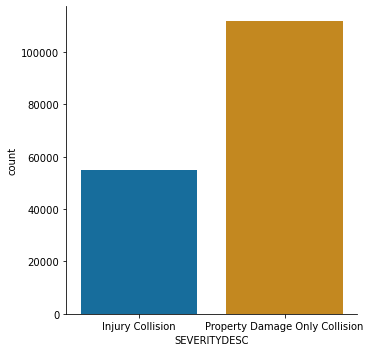

In [35]:
sns.catplot(x="SEVERITYDESC", kind="count", palette="colorblind", data=df_clean)

On this preliminary stage we determined that (as expected) property damage only collisions are more common than collisions which result in injuries. 

In [36]:
df_cond_bar = df_cond [['SEVERITYCODE', 'WEATHER','ROADCOND','LIGHTCOND']].copy()
df_cond.index.name = 'Incident'

We will proceed to encode all variables into 3 main categories to facilitate the analysis

In [37]:
#REcoding light Conditions (0 = Daylight, 1 = Low Visibility, 2 = Dark or Unwkown Lighting 3= Other/Unknown
df_cond_bar["LIGHTCOND"].replace(0, "Daylight", inplace=True)
df_cond_bar["LIGHTCOND"].replace(1, "Low Visibility", inplace=True)
df_cond_bar["LIGHTCOND"].replace(2, "Dark or Unknown", inplace=True)
df_cond_bar["LIGHTCOND"].replace(3, "Other/Unkown", inplace=True)
#REcoding Weather Conditions(0 = Clear, 1 = Overcast and Cloudy, 2 = Windy, 3 = Rain and Snow
df_cond_bar["WEATHER"].replace(0, "Clear", inplace=True)
df_cond_bar["WEATHER"].replace(1,"Overcast and Cloudy", inplace=True)
df_cond_bar["WEATHER"].replace(2, "Windy", inplace=True)
df_cond_bar["WEATHER"].replace(3, "Rain and Snow", inplace=True)
#REcoding Road Conditions(0 = Dry, 1 = Mushy, 2 = Wet)
df_cond_bar["ROADCOND"].replace(0, "Dry", inplace=True)
df_cond_bar["ROADCOND"].replace(1, "Mushy", inplace=True)
df_cond_bar["ROADCOND"].replace(2, "Wet", inplace=True)
df_cond_bar.head(50)

df_cond_bar.head()

,SEVERITYCODE,WEATHER,ROADCOND,LIGHTCOND
Incident,,,,
0,2,Overcast and Cloudy,Wet,Daylight
1,1,Rain and Snow,Wet,Low Visibility
2,1,Overcast and Cloudy,Dry,Daylight
3,1,Clear,Dry,Daylight
4,2,Rain and Snow,Wet,Daylight


Let's see if worst weather conditions account more accidents

Text(0.8, 1, 'Weather condition during incidents')

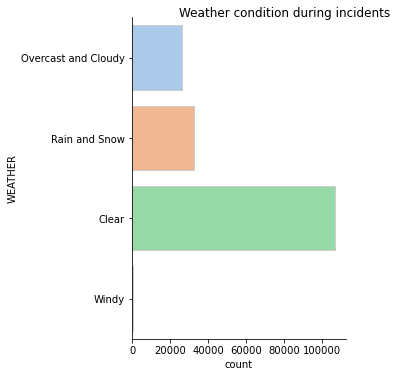

In [38]:
g1 = sns.catplot(y="WEATHER", kind="count",
            palette="pastel", edgecolor=".8",
            data=df_cond_bar)
g1.fig.suptitle ("Weather condition during incidents",
                y = 1, x = 0.8 ) 


Text(0.8, 1, 'Road conditions during incidents')

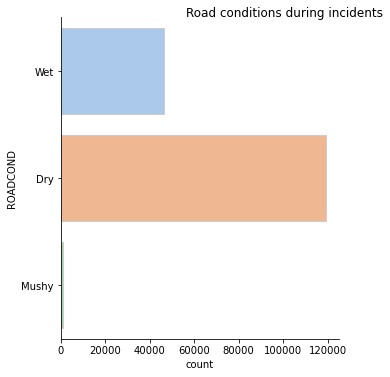

In [39]:
g2 = sns.catplot(y="ROADCOND", kind="count",
            palette="pastel", edgecolor=".8",
            data=df_cond_bar)
g2.fig.suptitle ("Road conditions during incidents",
                y = 1, x = 0.8 ) 


Text(0.8, 1, 'Light condition during incidents')

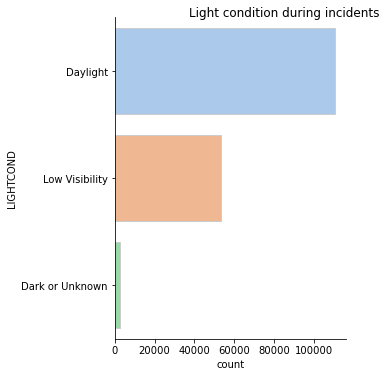

In [40]:
g3 = sns.catplot(y="LIGHTCOND", kind="count",
            palette="pastel", edgecolor=".8",
            data=df_cond_bar)
g3.fig.suptitle ("Light condition during incidents",
                y = 1, x = 0.8 ) 


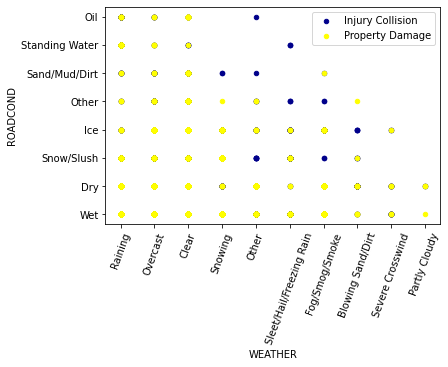

In [110]:
ax = df_clean[df_clean['SEVERITYCODE'] == 1][0:166000].plot(kind='scatter', x='WEATHER', y='ROADCOND', color='DarkBlue', label='Injury Collision');
df_clean[df_clean['SEVERITYCODE'] == 2][0:166000].plot(kind='scatter', x='WEATHER', y='ROADCOND', color='Yellow', label='Property Damage', ax=ax);
degrees = 70
plt.xticks(rotation=degrees)
plt.show()

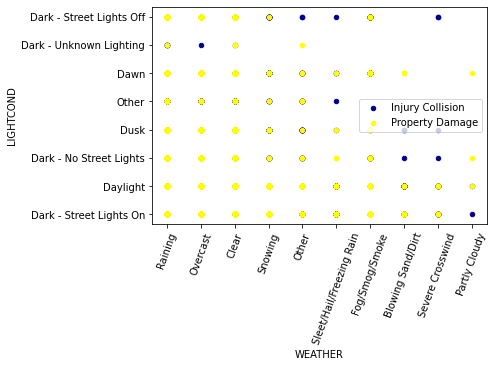

In [111]:
ax = df_clean[df_clean['SEVERITYCODE'] == 1][0:166000].plot(kind='scatter', x='WEATHER', y='LIGHTCOND', color='DarkBlue', label='Injury Collision');
df_clean[df_clean['SEVERITYCODE'] == 2][0:166000].plot(kind='scatter', x='WEATHER', y='LIGHTCOND', color='Yellow', label='Property Damage', ax=ax);
degrees = 70
plt.xticks(rotation=degrees)
plt.show()

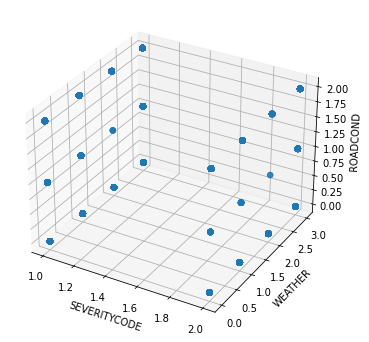

In [112]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_cond['SEVERITYCODE'],df_cond['WEATHER'],df_cond['ROADCOND'], s=30)
ax.set( xlabel='SEVERITYCODE', ylabel='WEATHER',zlabel='ROADCOND')
plt.show()

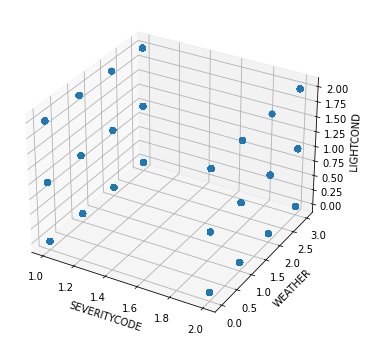

In [113]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_cond['SEVERITYCODE'],df_cond['WEATHER'],df_cond['LIGHTCOND'], s=30)
ax.set( xlabel='SEVERITYCODE', ylabel='WEATHER',zlabel='LIGHTCOND')
plt.show()

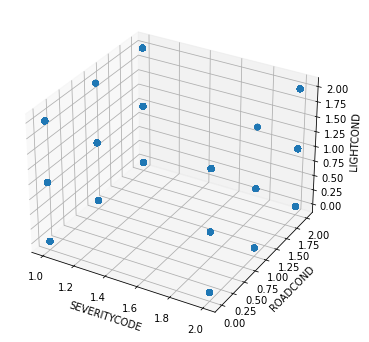

In [114]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10,6))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_cond['SEVERITYCODE'],df_cond['ROADCOND'],df_cond['LIGHTCOND'], s=30)
ax.set( xlabel='SEVERITYCODE', ylabel='ROADCOND',zlabel='LIGHTCOND')
plt.show()

As opposed to what we expected to find, Clear Weather Conditions, Dry Roads and Daylight is where most accidents happen. But then again, we are working with a full data set and we already know that there are more Property Damage only accidents than serious ones, so statistically it makes sense

In [41]:
df_col = df_cond_bar [['SEVERITYCODE','WEATHER','ROADCOND','LIGHTCOND']].copy()
df_col.head()
df_col = df_cond[['SEVERITYCODE','WEATHER','ROADCOND','LIGHTCOND']].copy()

In [42]:
df_col.to_csv('df_col.csv')

In [43]:
print (df_col.dtypes)

SEVERITYCODE    int64
WEATHER         int64
ROADCOND        int64
LIGHTCOND       int64
dtype: object


Now we will use ONE HOT ENCODING to normalize values and apply machine learning algorythms

In [44]:
df_new_col = pd.get_dummies(data=df_col, columns=['WEATHER', 'ROADCOND', 'LIGHTCOND'])

In [45]:
df_new_col.head()

,SEVERITYCODE,WEATHER_0,WEATHER_1,WEATHER_2,WEATHER_3,ROADCOND_0,ROADCOND_1,ROADCOND_2,LIGHTCOND_0,LIGHTCOND_1,LIGHTCOND_2
Incident,,,,,,,,,,,
0,2,0,1,0,0,0,0,1,1,0,0
1,1,0,0,0,1,0,0,1,0,1,0
2,1,0,1,0,0,1,0,0,1,0,0
3,1,1,0,0,0,1,0,0,1,0,0
4,2,0,0,0,1,0,0,1,1,0,0


In [46]:
#KNN 

In [48]:
X1 = df_new_col[['WEATHER_0','WEATHER_1','WEATHER_2','WEATHER_3', 'ROADCOND_0','ROADCOND_1','ROADCOND_2', 'LIGHTCOND_0','LIGHTCOND_1','LIGHTCOND_2']].values.astype(int)
X1[0:5]

array([[0, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 0, 0, 1, 0, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0, 0, 1, 1, 0, 0]])

In [49]:
y1 = df_col['SEVERITYCODE'].values.astype(int)
y1[0:5]

array([2, 1, 1, 1, 2])

Our first model will be based on K Nearest Neighbors

In [52]:
X1 = preprocessing.StandardScaler().fit(X1).transform(X1.astype(float))
X1[0:5]

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


array([[-1.33928821,  2.30201417, -0.06031282, -0.49307779, -1.59076954,
        -0.07304633,  1.61182106,  0.71283644, -0.68837929, -0.12513538],
       [-1.33928821, -0.43440219, -0.06031282,  2.02807755, -1.59076954,
        -0.07304633,  1.61182106, -1.40284635,  1.45268751, -0.12513538],
       [-1.33928821,  2.30201417, -0.06031282, -0.49307779,  0.62862657,
        -0.07304633, -0.62041626,  0.71283644, -0.68837929, -0.12513538],
       [ 0.74666528, -0.43440219, -0.06031282, -0.49307779,  0.62862657,
        -0.07304633, -0.62041626,  0.71283644, -0.68837929, -0.12513538],
       [-1.33928821, -0.43440219, -0.06031282,  2.02807755, -1.59076954,
        -0.07304633,  1.61182106,  0.71283644, -0.68837929, -0.12513538]])

In [54]:
from sklearn.model_selection import train_test_split
X1_train, X1_test, y1_train, y1_test = train_test_split( X1, y1, test_size=0.2, random_state=4)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (133096, 10) (133096,)
Test set: (33274, 10) (33274,)


In [55]:
k = 2
#Train Model and Predict  
neigh = KNeighborsClassifier(n_neighbors = k).fit(X1_train,y1_train)
neigh

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=None, n_neighbors=2, p=2,
           weights='uniform')

In [56]:
yhat1 = neigh.predict(X_test)
yhat1[0:5]

array([1, 1, 1, 1, 1])

In [57]:
from sklearn import metrics
print("Train set Accuracy: ", metrics.accuracy_score(y1_train, neigh.predict(X1_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y1_test, yhat1))

Train set Accuracy:  0.6261420328184167
Test set Accuracy:  0.620213980885977


In [58]:
Ks = 10
mean_acc = np.zeros((Ks-1))
std_acc = np.zeros((Ks-1))
ConfustionMx = [];
for n in range(1,Ks):
    
    #Train Model and Predict  
    neigh = KNeighborsClassifier(n_neighbors = n).fit(X1_train,y1_train)
    yhat1=neigh.predict(X1_test)
    mean_acc[n-1] = metrics.accuracy_score(y1_test, yhat1)

    
    std_acc[n-1]=np.std(yhat1==y1_test)/np.sqrt(yhat1.shape[0])

mean_acc

array([0.40430967, 0.62021398, 0.55475747, 0.55947587, 0.55947587,
       0.55947587, 0.5580333 , 0.55947587, 0.55947587])

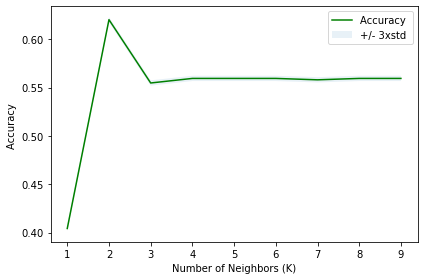

In [59]:
plt.plot(range(1,Ks),mean_acc,'g')
plt.fill_between(range(1,Ks),mean_acc - 1 * std_acc,mean_acc + 1 * std_acc, alpha=0.10)
plt.legend(('Accuracy ', '+/- 3xstd'))
plt.ylabel('Accuracy ')
plt.xlabel('Number of Neighbors (K)')
plt.tight_layout()
plt.show()

In [61]:
print( "The best accuracy was with", mean_acc.max(), "with k=", mean_acc.argmax()+1) 

The best accuracy was with 0.620213980885977 with k= 2


In [62]:
import pandas as pd
import pylab as pl
import numpy as np
import scipy.optimize as opt
from sklearn import preprocessing
%matplotlib inline 
import matplotlib.pyplot as plt

In [63]:
#LOGISTICS REGRESSION

In [64]:
X2 = df_new_col[['WEATHER_0','WEATHER_1','WEATHER_2','WEATHER_3', 'ROADCOND_0','ROADCOND_1','ROADCOND_2', 'LIGHTCOND_0','LIGHTCOND_1','LIGHTCOND_2']].values.astype(int)
X2[0:5]

array([[0, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 0, 0, 1, 0, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0, 0, 1, 1, 0, 0]])

In [65]:
y2 = np.asarray(df_new_col["SEVERITYCODE"])
y2[0:5]

array([2, 1, 1, 1, 2])

In [66]:
from sklearn import preprocessing
X2 = preprocessing.StandardScaler().fit(X2).transform(X2)
X2[0:5]

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


array([[-1.33928821,  2.30201417, -0.06031282, -0.49307779, -1.59076954,
        -0.07304633,  1.61182106,  0.71283644, -0.68837929, -0.12513538],
       [-1.33928821, -0.43440219, -0.06031282,  2.02807755, -1.59076954,
        -0.07304633,  1.61182106, -1.40284635,  1.45268751, -0.12513538],
       [-1.33928821,  2.30201417, -0.06031282, -0.49307779,  0.62862657,
        -0.07304633, -0.62041626,  0.71283644, -0.68837929, -0.12513538],
       [ 0.74666528, -0.43440219, -0.06031282, -0.49307779,  0.62862657,
        -0.07304633, -0.62041626,  0.71283644, -0.68837929, -0.12513538],
       [-1.33928821, -0.43440219, -0.06031282,  2.02807755, -1.59076954,
        -0.07304633,  1.61182106,  0.71283644, -0.68837929, -0.12513538]])

In [67]:
from sklearn.model_selection import train_test_split
X2_train, X2_test, y2_train, y2_test = train_test_split( X2, y2, test_size=0.3, random_state=4)
print ('Train set:', X2_train.shape,  y2_train.shape)
print ('Test set:', X2_test.shape,  y2_test.shape)

Train set: (116459, 10) (116459,)
Test set: (49911, 10) (49911,)


In [68]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
LR = LogisticRegression(C=0.1, solver='liblinear').fit(X2_train,y2_train)
LR

LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='liblinear',
          tol=0.0001, verbose=0, warm_start=False)

In [69]:
yhat2 = LR.predict(X2_test)
yhat2

array([1, 1, 1, ..., 1, 1, 1])

In [70]:
yhat2_prob = LR.predict_proba(X2_test)
yhat2_prob

array([[0.67582329, 0.32417671],
       [0.69261623, 0.30738377],
       [0.67582329, 0.32417671],
       ...,
       [0.66342093, 0.33657907],
       [0.64584857, 0.35415143],
       [0.66342093, 0.33657907]])

In [71]:
from sklearn.metrics import jaccard_similarity_score
jaccard_similarity_score(y2_test, yhat2)

0.6697521588427401

In [82]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=True,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
print(confusion_matrix(y2_test, yhat2, labels=[1,2]))

[[33428     0]
 [16483     0]]


Confusion matrix, without normalization
[[33428     0]
 [16483     0]]


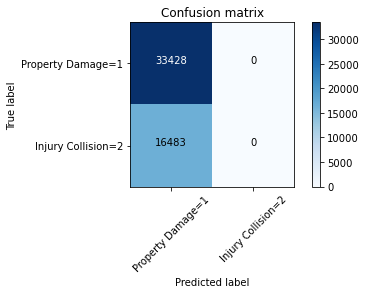

In [83]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(y2_test, yhat2, labels=[1,2])
np.set_printoptions(precision=2)


# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Property Damage=1','Injury Collision=2'],normalize= False,  title='Confusion matrix')

In [84]:
print (classification_report(y2_test, yhat2))

              precision    recall  f1-score   support

           1       0.67      1.00      0.80     33428
           2       0.00      0.00      0.00     16483

   micro avg       0.67      0.67      0.67     49911
   macro avg       0.33      0.50      0.40     49911
weighted avg       0.45      0.67      0.54     49911



/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [ ]:
#SVM

In [85]:
feature_df = df_new_col[['WEATHER_0','WEATHER_1','WEATHER_2','WEATHER_3', 'ROADCOND_0','ROADCOND_1','ROADCOND_2', 'LIGHTCOND_0','LIGHTCOND_1','LIGHTCOND_2']]
X4 = np.asarray(feature_df)
X4[0:5]

array([[0, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 0, 0, 1, 0, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0, 0, 1, 1, 0, 0]], dtype=uint8)

In [86]:
df_new_col['SEVERITYCODE'] = df_new_col['SEVERITYCODE'].astype('int')
y4 = np.asarray(df_new_col['SEVERITYCODE'])
y4 [0:5]

array([2, 1, 1, 1, 2])

In [87]:
X4_train, X4_test, y4_train, y4_test = train_test_split( X4, y4, test_size=0.3, random_state=4)
print ('Train set:', X4_train.shape,  y4_train.shape)
print ('Test set:', X4_test.shape,  y4_test.shape)

Train set: (116459, 10) (116459,)
Test set: (49911, 10) (49911,)


In [88]:
from sklearn.svm import SVC
classifier = SVC(kernel = 'rbf', C = 0.1, gamma = 0.2)
classifier.fit(X4_train, y4_train)

SVC(C=0.1, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma=0.2, kernel='rbf',
  max_iter=-1, probability=False, random_state=None, shrinking=True,
  tol=0.001, verbose=False)

In [89]:
yhat4 = classifier.predict(X4_test)
yhat4 [0:5]

array([1, 1, 1, 1, 1])

In [90]:
from sklearn.metrics import classification_report, confusion_matrix
import itertools

In [91]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 4.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [ ]:
# Compute confusion matrix
cnf_matrix = confusion_matrix(y4_test, yhat4, labels=[2,1])
np.set_printoptions(precision=4)

print (classification_report(y_test, yhat))

# Plot non-normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=['Property Damage(1)','Injury Collision(2)'],normalize= False,  title='Confusion matrix')

In [92]:
from sklearn.metrics import f1_score
f1_score(y4_test, yhat4, average='weighted') 

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


0.5372868684720266

In [93]:
from sklearn.metrics import jaccard_similarity_score
jaccard_similarity_score(y4_test, yhat4)

0.6697521588427401

In [94]:
print (classification_report(y4_test, yhat4))

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/metrics/classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           1       0.67      1.00      0.80     33428
           2       0.00      0.00      0.00     16483

   micro avg       0.67      0.67      0.67     49911
   macro avg       0.33      0.50      0.40     49911
weighted avg       0.45      0.67      0.54     49911



In [95]:
#DECISION TREE

In [96]:
X3 = df_new_col[['WEATHER_0','WEATHER_1','WEATHER_2','WEATHER_3', 'ROADCOND_0','ROADCOND_1','ROADCOND_2', 'LIGHTCOND_0','LIGHTCOND_1','LIGHTCOND_2']].values.astype(int)
X3[0:5]

array([[0, 1, 0, 0, 0, 0, 1, 1, 0, 0],
       [0, 0, 0, 1, 0, 0, 1, 0, 1, 0],
       [0, 1, 0, 0, 1, 0, 0, 1, 0, 0],
       [1, 0, 0, 0, 1, 0, 0, 1, 0, 0],
       [0, 0, 0, 1, 0, 0, 1, 1, 0, 0]])

In [98]:
y3 = np.asarray(df_new_col["SEVERITYCODE"])
y3[0:5]

array([2, 1, 1, 1, 2])

In [99]:
ConditionsTree = DecisionTreeClassifier(criterion="entropy", max_depth = 4)
ConditionsTree # it shows the default parameters

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [100]:
X3_trainset, X3_testset, y3_trainset, y3_testset = train_test_split(X3, y3, test_size=0.3, random_state=3)
ConditionsTree.fit(X3_trainset,y3_trainset)

DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=None,
            splitter='best')

In [102]:
predTree = ConditionsTree.predict(X3_testset)

In [103]:
print (predTree [0:5])
print (y3_testset [0:5])

[1 1 1 1 1]
[2 1 1 1 1]


In [104]:
from sklearn import metrics
import matplotlib.pyplot as plt
print("DecisionTrees's Accuracy: ", metrics.accuracy_score(y3_testset, predTree))

DecisionTrees's Accuracy:  0.6713950832481818


In [ ]:
#INCIDENT OCURRENCE MAPPING

In [105]:
!conda install -c conda-forge folium=0.5.0 --yes
# import folium

print('Folium installed and imported!')

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - folium=0.5.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    altair-4.1.0               |             py_1         614 KB  conda-forge
    branca-0.4.1               |             py_0          26 KB  conda-forge
    brotlipy-0.7.0             |py36h8c4c3a4_1000         346 KB  conda-forge
    chardet-3.0.4              |py36h9f0ad1d_1007         187 KB  conda-forge
    cryptography-3.1.1         |   py36h45558ae_0         617 KB  conda-forge
    folium-0.5.0               |             py_0          45 KB  conda-forge
    pandas-1.1.3               |   py36h831f99a_0        10.5 MB  conda-forge
    pysocks-1.7.1              |   py36h9f0ad1d_1          27 KB  conda-

In [106]:
limit = 100005
reduced_df = df_cond.iloc [0:limit:5, 0:]
reduced_df.head(100)

,SEVERITYCODE,SEVERITYDESC,X,Y,WEATHER,ROADCOND,LIGHTCOND
Incident,,,,,,,
0,2,Injury Collision,-122.323148,47.703140,1,2,0
5,1,Property Damage Only Collision,-122.387598,47.690575,0,0,0
11,1,Property Damage Only Collision,-122.333831,47.547371,0,0,0
18,2,Injury Collision,-122.328270,47.571420,0,0,0
25,2,Injury Collision,-122.312857,47.599218,0,0,0
...,...,...,...,...,...,...,...
579,2,Injury Collision,-122.342238,47.517285,0,0,0
584,1,Property Damage Only Collision,-122.326228,47.723973,1,0,0
590,2,Injury Collision,-122.293169,47.536762,1,0,1


In [107]:
#Folium Map
seattle_map = folium.Map(location=[47.61536892, -122.3302243], zoom_start=14)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the 100 crimes and add each to the incidents feature group
for lat, lng, in zip(reduced_df.Y, reduced_df.X):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=2, # define how big you want the circle markers to be
            color='red',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6      
        )
    )

# add incidents to map
seattle_map.add_child(incidents)


In [108]:
## Results and Discussion: Overview of data presented <a name="results"></a>

On a personal level I must say this has been one of the most difficult tasks I have set out to do in my professional career. Even though the course explains a lot of the tools used in this analysis, there are so many methods, parameters and overall tweaks that aren´t explained, that for someone with no pythong programming whatsoever, it's like trying to find a needle in a haystack in the dark. There was so much internet research involved and still I'm not happy with the results. One big example is the confusion matrix, which was taken from the labs notebooks. I copied each line of code exactly as it was on the Coursera Labs Jupyter Notebooks, and I still can't for the life of me get a matrix with all four quadrants filled. The same situation with plotting a decent Decision Tree.

Nevertheless I really enjoyed the experience, so much so that I'm starting a Masters in Big data come october, in which I hope I can gain more knowledge to finally make a transition in my career.

Enough about personal insights, let's get to the... conclusions....

In [109]:
## Conclusions <a name="conclusions"></a>

After finising up all details, maybe because of the data selected or maybe because of the application of ML models, there's no clear incidence on weather, light conditions or road conditions in the probable outcome of an serious accident. Logics say that a low visibility potentially dangerous condition would result in a more serious crash, but in terms of results I have no data to back up my affirmations. I set out to revise the initial data in a later stage, but with the knowledge I have adquired so far, this is my absolute best.

THe final results for the methods are applied are as follow:

KNN: The best accuracy was with 0.620213980885977 with k= 2

SVM: The model acuracy for SVM, by means of the LIGHTCOND, ROADCOND AND WEATHER VARIABLES is
F1 Score: 0.5372868684720266
Jaccard Similarity Score: 0.6697521588427401


LOGISTICS REGRESSION
            precision    recall  f1-score   support

           1       0.67      1.00      0.80     33428
           2       0.00      0.00      0.00     16483

   micro avg       0.67      0.67      0.67     49911
   macro avg       0.33      0.50      0.40     49911
weighted avg       0.45      0.67      0.54     49911


DecisionTrees's Model Accuracy:  0.6713950832481818

As we can notice, all models have a similar coefficient for prediction, so it´s my job to explore further options in order to adapt the ML models to the dataset.